In [5]:
import os
import glob
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms
import albumentations as A
from albumentations.pytorch import ToTensorV2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary


Step 1: Image Preprocessing

In [6]:
class SegmentationDataset(Dataset):
    def __init__(self, folder_path, image_transform=None, mask_transform=None):
        self.folder_path = folder_path
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.image_paths = sorted(glob.glob(os.path.join(folder_path, "*_real_image.tif")))
        
        self.mask_paths = []
        for img_path in self.image_paths:
            filename = os.path.basename(img_path)  
            prefix = filename.split("_real_image")[0]
            gt_filename = prefix + "_ground_truth.png"
            gt_path = os.path.join(folder_path, gt_filename)
            self.mask_paths.append(gt_path)
            
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        image_path = self.image_paths[index]
        image = Image.open(image_path).convert("RGB")
        mask_path = self.mask_paths[index]
        mask = Image.open(mask_path).convert("L")
        
        image = self.image_transform(image)
        mask = self.mask_transform(mask)
        return image, mask


image_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std= [0.229, 0.224, 0.225]
    )
])
mask_transform = transforms.Compose([
    transforms.Resize((256, 256), interpolation=Image.NEAREST),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x > 0.5).long().squeeze(0))
])

dataset_folder = 'img_completeversion'
base_dataset = SegmentationDataset(
    folder_path=dataset_folder,
    image_transform=image_transform,
    mask_transform=mask_transform
)


preprocessed_dataloader = DataLoader(base_dataset, batch_size=11, shuffle=True)

#Check shapes:
for imgs, masks in preprocessed_dataloader:
    print("Preprocessed Images shape:", imgs.shape) 
    print("Preprocessed Masks shape:", masks.shape)    
    break


Preprocessed Images shape: torch.Size([11, 3, 256, 256])
Preprocessed Masks shape: torch.Size([11, 256, 256])


In [7]:
# After instantiating your dataset
dataset_folder = 'processedimg'
dataset = SegmentationDataset(
    folder_path=dataset_folder,
    image_transform=image_transform,
    mask_transform=mask_transform
)

# Debug: print out the file paths for images and masks
print("Found Real Images:")
for img_path in dataset.image_paths:
    print(img_path)

print("\nFound Ground Truth Masks:")
for mask_path in dataset.mask_paths:
    print(mask_path)


Found Real Images:
processedimg/00001_real_image.tif
processedimg/00002_real_image.tif
processedimg/00003_real_image.tif
processedimg/00004_real_image.tif
processedimg/00005_real_image.tif
processedimg/00006_real_image.tif
processedimg/00007_real_image.tif
processedimg/00008_real_image.tif
processedimg/00009_real_image.tif
processedimg/00010_real_image.tif
processedimg/00011_real_image.tif
processedimg/00012_real_image.tif
processedimg/00013_real_image.tif
processedimg/00014_real_image.tif
processedimg/00015_real_image.tif
processedimg/00016_real_image.tif
processedimg/00017_real_image.tif
processedimg/00018_real_image.tif
processedimg/00019_real_image.tif
processedimg/00020_real_image.tif
processedimg/00021_real_image.tif
processedimg/00022_real_image.tif
processedimg/00023_real_image.tif
processedimg/00024_real_image.tif
processedimg/00025_real_image.tif
processedimg/00026_real_image.tif
processedimg/00027_real_image.tif
processedimg/00028_real_image.tif
processedimg/00029_real_image

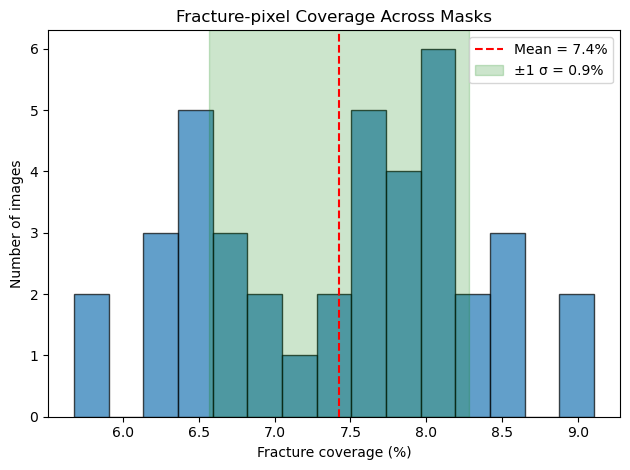

Average fracture coverage: 7.4% ± 0.9%


In [8]:
import glob, numpy as np
from PIL import Image
import matplotlib.pyplot as plt

mask_paths = sorted(glob.glob('processedimg/*_ground_truth.png'))
coverage = []
for p in mask_paths:
    mask = np.array(Image.open(p).convert('L'))
    # count black (fracture) pixels instead of white:
    frac_mask = (mask < 127).astype(np.uint8)
    coverage.append(frac_mask.mean() * 100)

coverage = np.array(coverage)
mean_cov, std_cov = coverage.mean(), coverage.std()

plt.hist(coverage, bins=15, edgecolor='k', alpha=0.7)
plt.axvline(mean_cov, color='r', linestyle='--', label=f'Mean = {mean_cov:.1f}%')
plt.axvspan(mean_cov-std_cov, mean_cov+std_cov, color='g', alpha=0.2,
            label=f'±1 σ = {std_cov:.1f}%')
plt.title("Fracture‐pixel Coverage Across Masks")
plt.xlabel("Fracture coverage (%)")
plt.ylabel("Number of images")
plt.legend()
plt.tight_layout()
plt.show()

print(f"Average fracture coverage: {mean_cov:.1f}% ± {std_cov:.1f}%")


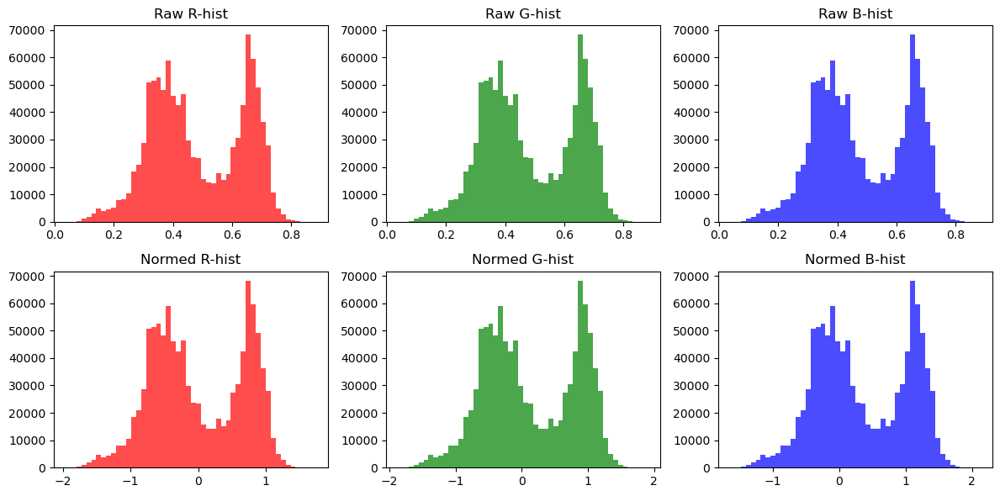

In [9]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

img = Image.open("processedimg/00001_real_image.tif").convert("RGB")
to_t   = transforms.ToTensor()
norm   = transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])

tensor = to_t(img)              # [3,H,W] in [0,1]
normed = norm(tensor)           # zero‑mean/unit‑var

fig, axs = plt.subplots(2, 3, figsize=(12, 6))
colors = ['R','G','B']

for i, c in enumerate(colors):
    axs[0,i].hist(tensor[i].numpy().ravel(), bins=50, color=c.lower(), alpha=0.7)
    axs[0,i].set_title(f"Raw {c}-hist")
    axs[1,i].hist(normed[i].numpy().ravel(), bins=50, color=c.lower(), alpha=0.7)
    axs[1,i].set_title(f"Normed {c}-hist")

plt.tight_layout()
plt.show()


In [10]:
import numpy as np
from PIL import Image

# Specify the path to your ground truth image
mask_path = "/home/av1824/downloads/Geomechanics & PTA/EX02_DeepLearning_optional/processedimg/00008_ground_truth.png"

# Open the image and convert it to grayscale ("L")
mask = Image.open(mask_path).convert("L")

# Convert the image into a NumPy array
mask_array = np.array(mask)

# Get the unique values in the ground truth
unique_values = np.unique(mask_array)

print("Unique values found in the mask:", unique_values)

# Check if the unique values are a subset of {0, 1}
if set(unique_values).issubset({0, 1}):
    print("The mask contains only 0 and 1.")
else:
    print("The mask contains values other than 0 and 1.")


Unique values found in the mask: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 2

Image Augmentation

In [11]:
augmentation = A.Compose([
    A.RandomCrop(width=256, height=256, p=1.0),
    A.Rotate(limit=20, p=0.5),
    A.HorizontalFlip(p=0.5),
    #A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.0, rotate_limit=0, p=0.5, border_mode=0),
    ToTensorV2()
], additional_targets={'mask': 'mask'})

# Create a wrapper dataset to apply augmentations on top of the preprocessed dataset.
class AugmentedDataset(Dataset):
    def __init__(self, base_dataset, augmentation):
        self.base_dataset = base_dataset
        self.augmentation = augmentation
        
    def __len__(self):
        return len(self.base_dataset)
    
    def __getitem__(self, index):
        # Get the preprocessed image and mask (both are tensors)
        image, mask = self.base_dataset[index]
        # Convert image from [3,H,W] to HWC numpy array.
        image_np = image.permute(1, 2, 0).cpu().numpy()
        # For the mask, assume it's already a 2D tensor.
        mask_np = mask.cpu().numpy()
        
        # Apply augmentation
        augmented = self.augmentation(image=image_np, mask=mask_np)
        # The augmentation pipeline returns a dictionary with keys 'image' and 'mask'
        return augmented['image'], augmented['mask']

# Create the augmented dataset
augmented_dataset = AugmentedDataset(base_dataset, augmentation)
augmented_dataloader = DataLoader(augmented_dataset, batch_size=11, shuffle=True)

# (Optional) Check shapes:
for aug_imgs, aug_masks in augmented_dataloader:
    print("Augmented Images shape:", aug_imgs.shape)  # Expected: [B, 3, 512, 512]
    print("Augmented Masks shape:", aug_masks.shape)    # Expected: [B, 512, 512]
    break


Augmented Images shape: torch.Size([11, 3, 256, 256])
Augmented Masks shape: torch.Size([11, 256, 256])


**Visualization of Augmented Sample**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


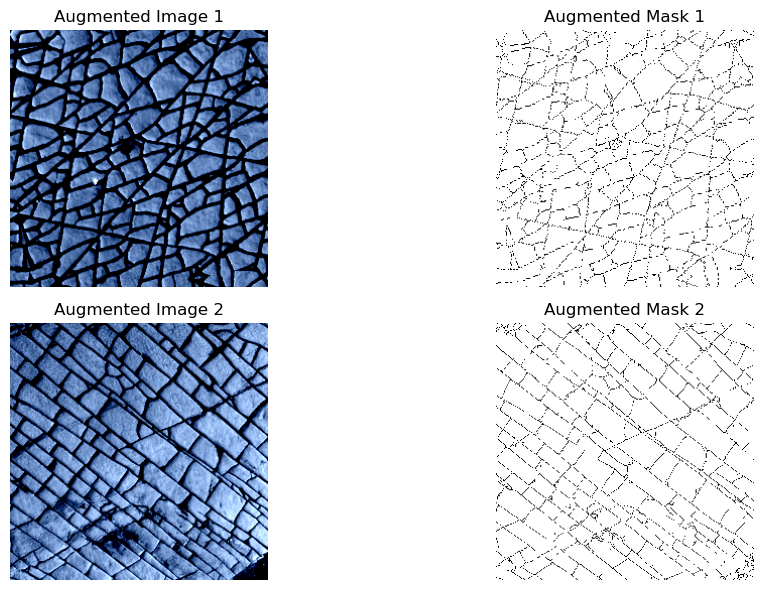

In [12]:
import matplotlib.pyplot as plt

# Visualize first 2 augmented image-mask pairs:
for aug_imgs, aug_masks in augmented_dataloader:
    num_display = 2
    plt.figure(figsize=(12, 6))
    for i in range(num_display):
        # Convert image tensor to numpy (H, W, C)
        img_disp = aug_imgs[i].permute(1, 2, 0).cpu().numpy()
        mask_disp = aug_masks[i].cpu().numpy()
        
        # Display the image
        plt.subplot(num_display, 2, 2*i+1)
        plt.imshow(img_disp)
        plt.axis("off")
        plt.title(f"Augmented Image {i+1}")
        
        # Display the corresponding mask
        plt.subplot(num_display, 2, 2*i+2)
        plt.imshow(mask_disp, cmap="gray")
        plt.axis("off")
        plt.title(f"Augmented Mask {i+1}")
    
    plt.tight_layout()
    plt.show()
    break  # only visualize one batch


**Creating the Model**

In [13]:

# A helper module: two successive convolutional layers with BatchNorm and ReLU.
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DoubleConv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
        
    def forward(self, x):
        return self.conv(x)

# U-Net architecture definition.
class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64, 128, 256, 512]):
        super(UNet, self).__init__()
        
        # Encoder (downsampling path)
        self.downs = nn.ModuleList()
        for feature in features:
            self.downs.append(DoubleConv(in_channels, feature))
            in_channels = feature
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        
        # Bottleneck
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        
        # Decoder (upsampling path)
        self.ups = nn.ModuleList()
        rev_features = features[::-1]
        for feature in rev_features:
            self.ups.append(nn.ConvTranspose2d(feature*2, feature, kernel_size=2, stride=2))
            self.ups.append(DoubleConv(feature*2, feature))
        
        # Final 1x1 convolution to map to desired output channels (e.g., 1 for binary segmentation)
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)
    
    def forward(self, x):
        skip_connections = []
        
        # Encoder: save skip connections and downsample
        for down in self.downs:
            x = down(x)
            skip_connections.append(x)
            x = self.pool(x)
        
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        
        # Decoder: upsample and concatenate with corresponding skip connection
        for idx in range(0, len(self.ups), 2):
            x = self.ups[idx](x)  # Upsample
            skip_connection = skip_connections[idx // 2]
            if x.shape != skip_connection.shape:
                # Resize x to match dimensions of skip connection if needed
                x = F.interpolate(x, size=skip_connection.shape[2:])
            x = torch.cat((skip_connection, x), dim=1)  # Concatenate along channel dimension
            x = self.ups[idx+1](x)  # Convolution block
        
        return self.final_conv(x)

# Example: Instantiate the U-Net model.
model = UNet(in_channels=3, out_channels=1)
# Check the model's architecture
summary(model, input_size=(3, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4         [-1, 64, 256, 256]          36,928
       BatchNorm2d-5         [-1, 64, 256, 256]             128
              ReLU-6         [-1, 64, 256, 256]               0
        DoubleConv-7         [-1, 64, 256, 256]               0
         MaxPool2d-8         [-1, 64, 128, 128]               0
            Conv2d-9        [-1, 128, 128, 128]          73,856
      BatchNorm2d-10        [-1, 128, 128, 128]             256
             ReLU-11        [-1, 128, 128, 128]               0
           Conv2d-12        [-1, 128, 128, 128]         147,584
      BatchNorm2d-13        [-1, 128, 128, 128]             256
             ReLU-14        [-1, 128, 1

In [14]:
print("Model summary:")
print(model)

Model summary:
UNet(
  (downs): ModuleList(
    (0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): Doubl

**Setting up Training**

In [15]:
from torch.utils.data import random_split, DataLoader

# Assume base_dataset is already defined (from Cell 1, processing images and masks)
dataset_size = len(augmented_dataset)
print("Total dataset size:", dataset_size)

# Define the sizes for each split (e.g., 70% training, 15% validation, 15% test)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

# Use torch.utils.data.random_split to create splits
train_dataset, val_dataset, test_dataset = random_split(augmented_dataset, [train_size, val_size, test_size])
print(f"Train: {len(train_dataset)} | Validation: {len(val_dataset)} | Test: {len(test_dataset)}")

# Create DataLoaders for each split
train_loader = DataLoader(train_dataset, batch_size=5, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=5, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=5, shuffle=False)


Total dataset size: 269
Train: 188 | Validation: 40 | Test: 41


In [16]:
import torch.nn.functional as F

def dice_coef(y_true, y_pred, smooth=1):
    y_pred = torch.sigmoid(y_pred)
    
    y_true_f = y_true.view(y_true.size(0), -1)
    y_pred_f = y_pred.view(y_pred.size(0), -1)
    
    intersection = (y_true_f * y_pred_f).sum(1)
    denominator = y_true_f.sum(1) + y_pred_f.sum(1)
    
    dice = (2. * intersection + smooth) / (denominator + smooth)
    #loss = 1 - dice
    return dice.mean()

def dice_loss(y_true, y_pred, smooth=1):
    y_pred = torch.sigmoid(y_pred)
    
    y_true_f = y_true.view(y_true.size(0), -1)
    y_pred_f = y_pred.view(y_pred.size(0), -1)
    
    intersection = (y_true_f * y_pred_f).sum(1)
    denominator = y_true_f.sum(1) + y_pred_f.sum(1)
    
    dice = (2. * intersection + smooth) / (denominator + smooth)
    loss = 1 - dice
    return loss.mean()

def combined_dice_bce_loss(y_pred, y_true, smooth=1):
    bce_loss = F.binary_cross_entropy_with_logits(y_pred, y_true)
    d_loss = dice_loss(y_true, y_pred, smooth)

    #return bce_loss + dice_coef
    return bce_loss + d_loss



In [17]:
import torch.nn as nn
import torch.optim as optim


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(in_channels=3, out_channels=1).to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

def train(model, optimizer, criterion, train_loader, device):
    model.train()
    running_loss = 0.0
    running_dice = 0.0
    
    for images, masks in train_loader:
        images = images.to(device)
        masks  = masks.to(device).unsqueeze(1).float()
        
        optimizer.zero_grad()
        outputs = model(images)       # raw logits
        
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        running_dice += dice_coef(masks, outputs).item()
    
    train_loss = running_loss / len(train_loader)
    train_dice = running_dice  / len(train_loader)
    return train_loss, train_dice

def validate(model, criterion, valid_loader, device):
    model.eval()
    running_loss = 0.0
    running_dice = 0.0
    
    with torch.no_grad():
        for images, masks in valid_loader:
            images = images.to(device)
            masks  = masks.to(device).unsqueeze(1).float()
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            running_loss += loss.item()
            running_dice += dice_coef(masks, outputs).item()
    
    val_loss = running_loss / len(valid_loader)
    val_dice = running_dice  / len(valid_loader)
    return val_loss, val_dice

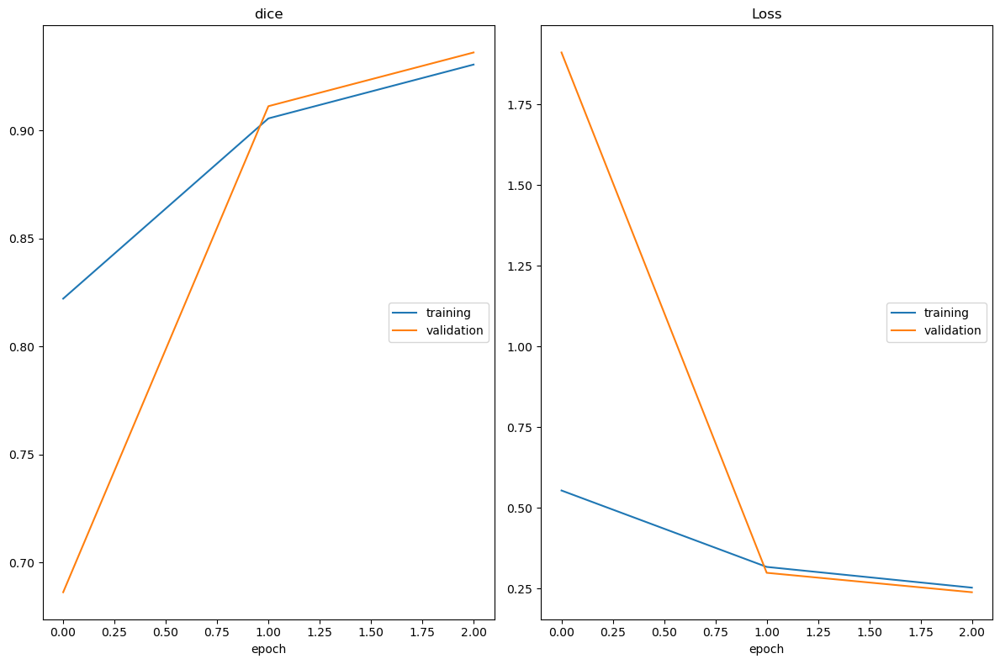

dice
	training         	 (min:    0.822, max:    0.930, cur:    0.930)
	validation       	 (min:    0.686, max:    0.936, cur:    0.936)
Loss
	training         	 (min:    0.252, max:    0.553, cur:    0.252)
	validation       	 (min:    0.238, max:    1.911, cur:    0.238)
0.2380785085260868
Training complete!


In [18]:
n_epochs = 3
criterion = combined_dice_bce_loss

from livelossplot import PlotLosses

liveloss = PlotLosses()
for epoch in range(n_epochs):
    logs = {}
    train_loss, train_dice = train(model, optimizer, criterion, train_loader, device)
    logs['loss'] = train_loss
    logs['dice'] = train_dice

    val_loss, val_dice = validate(model, criterion, val_loader, device)
    logs['val_loss'] = val_loss
    logs['val_dice'] = val_dice

    liveloss.update(logs)
    liveloss.draw()
    print(val_loss)


print("Training complete!")


In [19]:
import pickle
pickle.dump(model, open('model_clahe.pkl','wb'))

**Train**

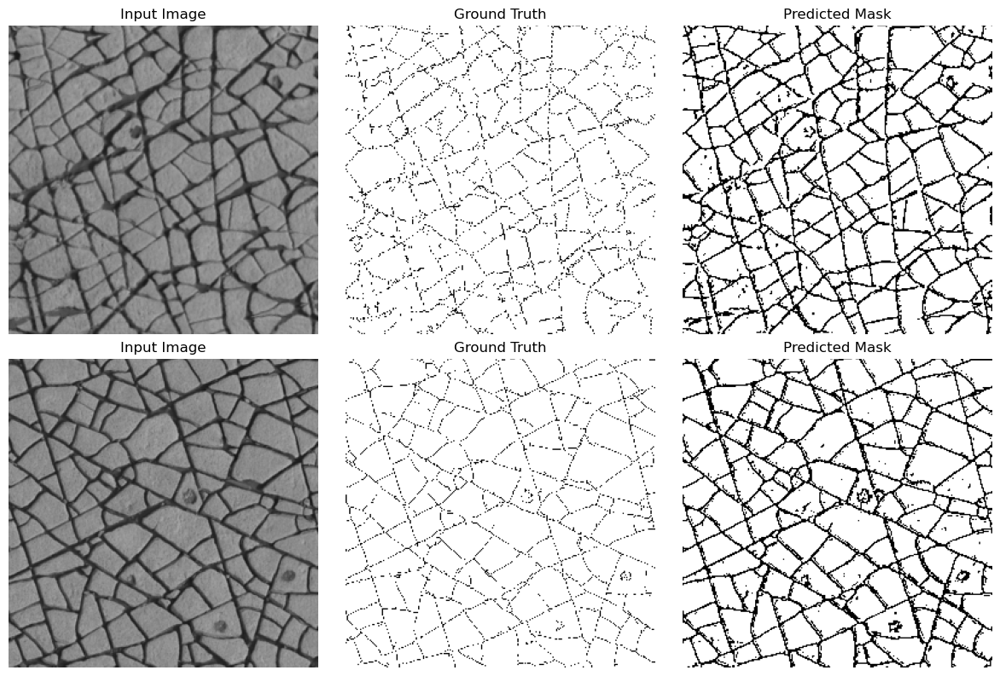

In [85]:
import matplotlib.pyplot as plt
import torch

model.eval()
with torch.no_grad():
    images, masks = next(iter(val_loader))
    images = images.to(device)
    
    outputs = model(images)                
    probs   = torch.sigmoid(outputs).cpu() 

n = 2
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    # 1) Input image
    img = images[i].cpu().permute(1,2,0).numpy()
    axes[i,0].imshow(img)
    axes[i,0].set_title("Input Image")
    axes[i,0].axis("off")
    
    # 2) Ground truth
    gt_mask = masks[i].cpu().numpy()
    axes[i,1].imshow(gt_mask, cmap='gray')
    axes[i,1].set_title("Ground Truth")
    axes[i,1].axis("off")
    
    # 3) Soft probability map in grayscale
    prob_map = probs[i,0].numpy()
    bin_mask = (prob_map > 0.9).astype(np.uint8) * 255
    axes[i,2].imshow(bin_mask, cmap='gray')
    axes[i,2].set_title("Predicted Mask")
    axes[i,2].axis("off")
    

plt.tight_layout()
plt.show()


**Add CLAHE**

In [ ]:
aug_clahe = A.Compose([
    A.CLAHE(clip_limit=2.0, tile_grid_size=(8,8), p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.HorizontalFlip(p=0.5),
    ToTensorV2()
], additional_targets={'mask':'mask'})


clahe_dataset = AugmentedDataset(base_dataset, aug_clahe)

In [60]:
dataset_size = len(clahe_dataset)
print("Total dataset size:", dataset_size)

# Define the sizes for each split (e.g., 70% training, 15% validation, 15% test)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

# Use torch.utils.data.random_split to create splits
train_dataset, val_dataset, test_dataset = random_split(clahe_dataset, [train_size, val_size, test_size])
print(f"Train: {len(train_dataset)} | Validation: {len(val_dataset)} | Test: {len(test_dataset)}")

# Create DataLoaders for each split
train_loader_clahe = DataLoader(train_dataset, batch_size=5, shuffle=True)
val_loader_clahe = DataLoader(val_dataset, batch_size=5, shuffle=False)
test_loader_clahe = DataLoader(test_dataset, batch_size=5, shuffle=False)


Total dataset size: 269
Train: 188 | Validation: 40 | Test: 41


In [4]:
model_clahe = UNet(in_channels=3, out_channels=1).to(device)
opt_clahe   = optim.Adam(model_clahe.parameters(), lr=1e-3)

criterion   = combined_dice_bce_loss
n_epochs    = 5


liveloss = PlotLosses()

for epoch in range(n_epochs):
    logs = {}
    train_loss, train_dice = train(model_clahe, opt_clahe, criterion, train_loader_clahe, device)
    logs['loss'] = train_loss
    logs['dice'] = train_dice

    val_loss, val_dice = validate(model_clahe, criterion, val_loader_clahe, device)
    logs['val_loss'] = val_loss
    logs['val_dice'] = val_dice

    liveloss.update(logs)
    liveloss.draw()
    print(val_loss)

print("Done!")


NameError: name 'UNet' is not defined

In [ ]:
import pickle
pickle.dump(model_clahe, open('model_clahe.pkl','wb'))


NameError: name 'model_clahe' is not defined

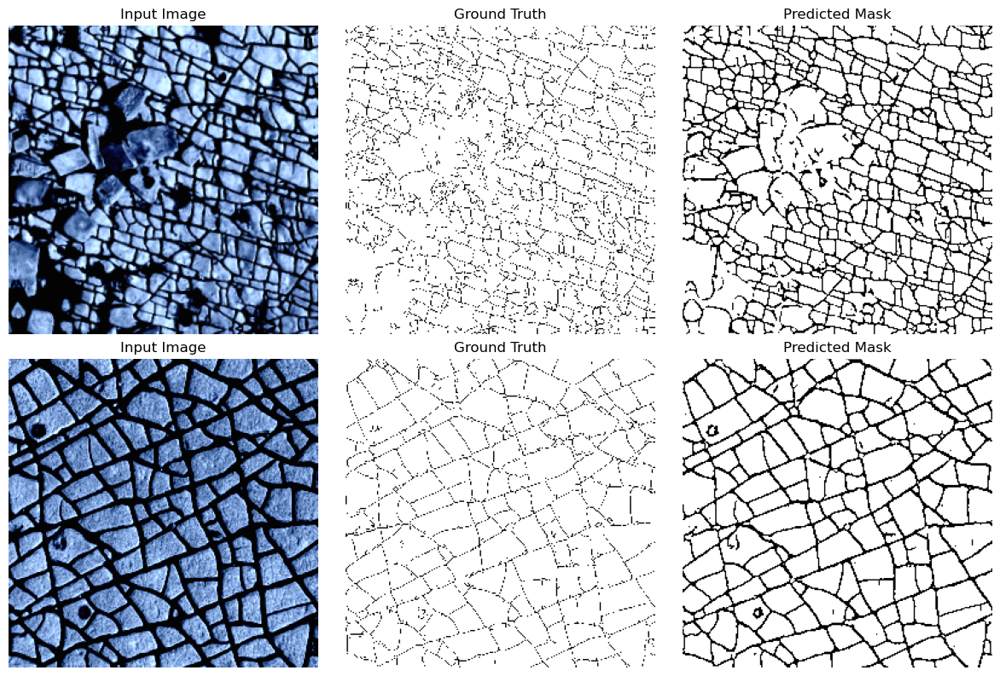

In [70]:
model_clahe.eval()
with torch.no_grad():
    images, masks = next(iter(val_loader_clahe))
    images = images.to(device)
    
    outputs = model_clahe(images)
    probs   = torch.sigmoid(outputs).cpu()  

n = 2
fig, axes = plt.subplots(n, 3, figsize=(12, 4 * n))

for i in range(n):
    # 1) Input image
    img = images[i].cpu().permute(1,2,0).numpy()
    axes[i,0].imshow(img)
    axes[i,0].set_title("Input Image")
    axes[i,0].axis("off")
    
    # 2) Ground truth
    gt_mask = masks[i].cpu().numpy()
    axes[i,1].imshow(gt_mask, cmap='gray')
    axes[i,1].set_title("Ground Truth")
    axes[i,1].axis("off")
    
    # 3) Soft probability map in grayscale
    prob_map = probs[i,0].numpy()
    bin_mask = (prob_map > 0.9).astype(np.uint8) * 255
    axes[i,2].imshow(bin_mask, cmap='gray')
    axes[i,2].set_title("Predicted Mask")
    axes[i,2].axis("off")

plt.tight_layout()
plt.show()


In [72]:
from tqdm import tqdm

# 1) Where to save
output_dir = "saved_predictions"
os.makedirs(output_dir, exist_ok=True)

# 2) Put model in eval mode
model_clahe.eval()

# 3) Iterate over your test loader
with torch.no_grad():
    for batch_idx, (images, masks) in enumerate(tqdm(test_loader_clahe, desc="Saving outputs")):
        images = images.to(device)                   # [B,3,H,W]
        logits = model_clahe(images)                 # [B,1,H,W]
        probs  = torch.sigmoid(logits).cpu().numpy() # [B,1,H,W]
        
        # If your dataset provides filenames, unpack them here:
        # _, _, fnames = batch  # otherwise just enumerate
        
        for i in range(probs.shape[0]):
            prob_map = probs[i,0]                   # [H,W] float in [0,1]
            
            # 4a) Save soft probability map as 8‑bit PNG
            prob_img = (prob_map > 0.9).astype(np.uint8) * 255
            fname_prob = f"sample_{batch_idx}_{i}_prediction.png"
            Image.fromarray(prob_img).save(os.path.join(output_dir, fname_prob))
            
            # 4b) Optionally, save a hard mask at threshold=0.5
            mask_bin = (prob_map > 0.5).astype(np.uint8) * 255
            fname_mask = f"sample_{batch_idx}_{i}_mask.png"
            Image.fromarray(mask_bin).save(os.path.join(output_dir, fname_mask))

Saving outputs: 100%|██████████| 9/9 [00:20<00:00,  2.25s/it]


**Compute Fracture Intensity**

In [73]:
import cv2

def canny_filter(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 1.4)
    edges  = cv2.Canny(blur, 50, 150)
    return edges

def edge_enhance(filename):
    img = cv2.imread(filename)
    #edges = canny_filter(img)
    # Apply histogram equalization to enhance contrast
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    ycrcb[:, :, 0] = cv2.equalizeHist(ycrcb[:, :, 0])
    img_eq = cv2.cvtColor(ycrcb, cv2.COLOR_YCrCb2BGR)
    # Apply Canny edge detection again
    edges = canny_filter(img_eq)
    return edges

def calculate_fracture_density(edges, height, width, line_pos):
    line_length = height
    intersection_count = 0
    for y in range(height):
        x = line_pos
        if edges[y, x] == 255:
            intersection_count += 1
    fracture_density = intersection_count / line_length
    return fracture_density, intersection_count

def calculate_fracture_density2(edges, height, width, line_pos):
    x_start = line_pos
    x_end = line_pos
    y_start = 0
    y_end = height 

    line_mask = np.zeros_like(edges, dtype=np.uint8)
    cv2.line(line_mask,
             (line_pos, 0),
             (line_pos, height),
             color=255,
             thickness=2,
             lineType=cv2.LINE_8)

    effective_length = np.count_nonzero(line_mask)
    line_start = (x_start, y_start)
    line_end = (x_end, y_end)
    intersections = cv2.bitwise_and(edges, cv2.line(np.zeros_like(edges),\
                                                       line_start, line_end, (255, 255, 255), 2))
    intersection_count = np.sum(intersections == 255)
    
    cv2.line(edges, line_start, line_end, (255, 250, 255), 2 )
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax[0].imshow(intersections)
    ax[1].imshow(edges)
    plt.tight_layout()
    plt.show()


    fracture_density = intersection_count / effective_length
    return fracture_density, intersection_count

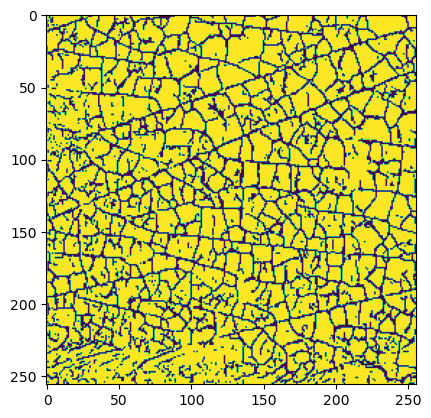

In [74]:
# Load the saved prediction image
filename = 'saved_predictions/sample_0_4_prediction.png'
img = plt.imread(filename)
plt.imshow(img)

edges = edge_enhance('saved_predictions/sample_0_4_prediction.png')
height, width = edges.shape
line_pos = int(width/10)

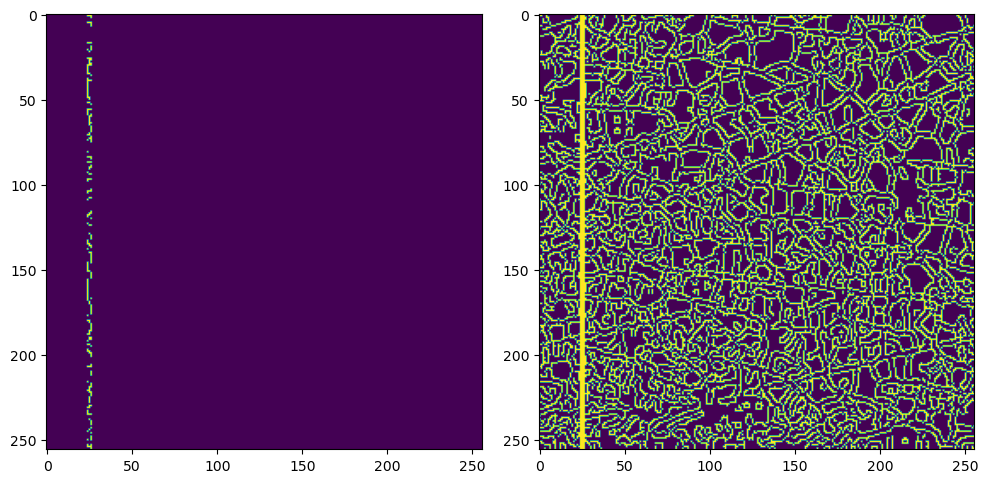

((0.265625, 68), (0.3268229166666667, 251))

In [75]:
calculate_fracture_density(edges, height, width, line_pos), calculate_fracture_density2(edges, height, width, line_pos)

In [77]:
edges = edge_enhance('saved_predictions/sample_0_4_prediction.png')
height, width = edges.shape
num_boreholes = 20
fracture_density= []
intersection_count = []
for i in range(num_boreholes):
    line_pos = int(np.random.uniform(width-1))
    f, ic = calculate_fracture_density(edges, height, width, line_pos)
    fracture_density.append(f)
    intersection_count.append(ic)
    print(f"borehole {i+1}: Line_pos = {line_pos}, Intersection count = {intersection_count[i]}, Fracture density = {fracture_density[i]}")

borehole 1: Line_pos = 27, Intersection count = 88, Fracture density = 0.34375
borehole 2: Line_pos = 136, Intersection count = 85, Fracture density = 0.33203125
borehole 3: Line_pos = 32, Intersection count = 84, Fracture density = 0.328125
borehole 4: Line_pos = 128, Intersection count = 64, Fracture density = 0.25
borehole 5: Line_pos = 159, Intersection count = 81, Fracture density = 0.31640625
borehole 6: Line_pos = 65, Intersection count = 75, Fracture density = 0.29296875
borehole 7: Line_pos = 249, Intersection count = 81, Fracture density = 0.31640625
borehole 8: Line_pos = 40, Intersection count = 82, Fracture density = 0.3203125
borehole 9: Line_pos = 68, Intersection count = 76, Fracture density = 0.296875
borehole 10: Line_pos = 6, Intersection count = 87, Fracture density = 0.33984375
borehole 11: Line_pos = 139, Intersection count = 65, Fracture density = 0.25390625
borehole 12: Line_pos = 81, Intersection count = 66, Fracture density = 0.2578125
borehole 13: Line_pos = 

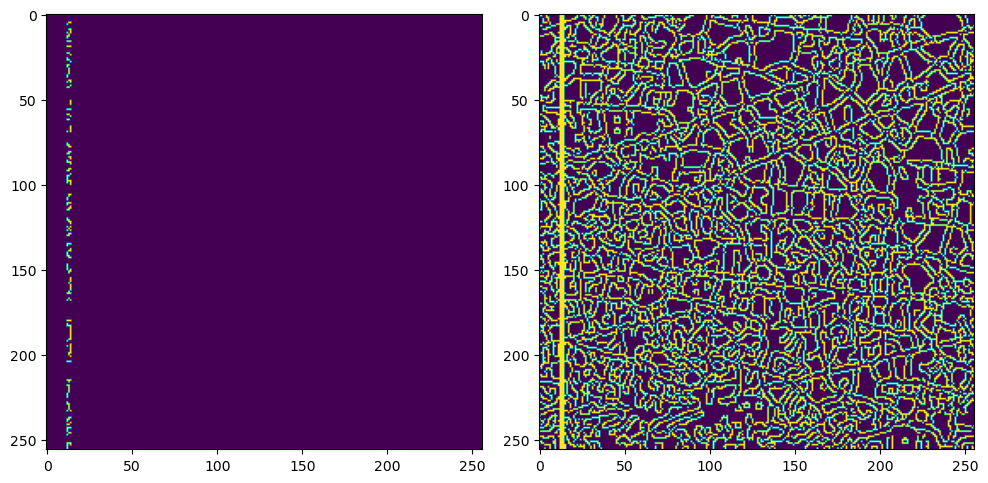

borehole 1: Line_pos = 13, Intersection count = 228, Fracture density = 0.296875


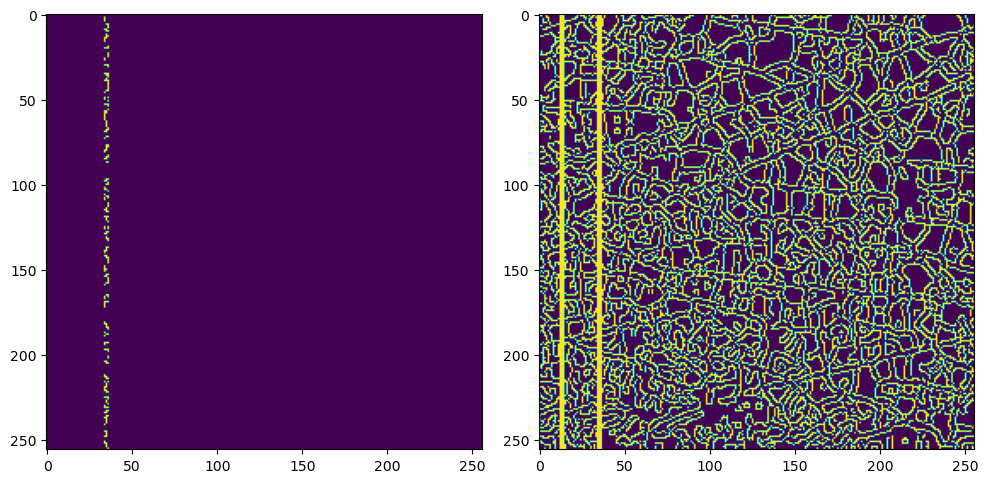

borehole 2: Line_pos = 35, Intersection count = 251, Fracture density = 0.3268229166666667


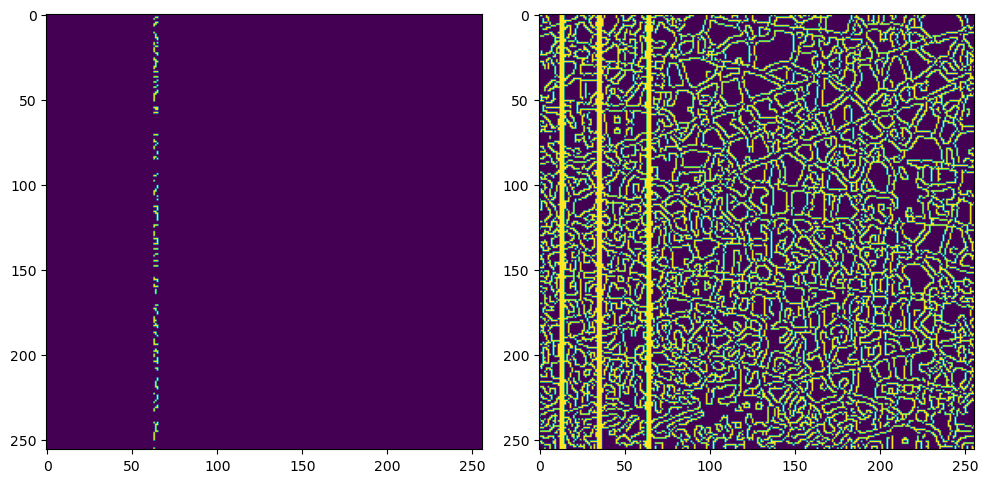

borehole 3: Line_pos = 64, Intersection count = 222, Fracture density = 0.2890625


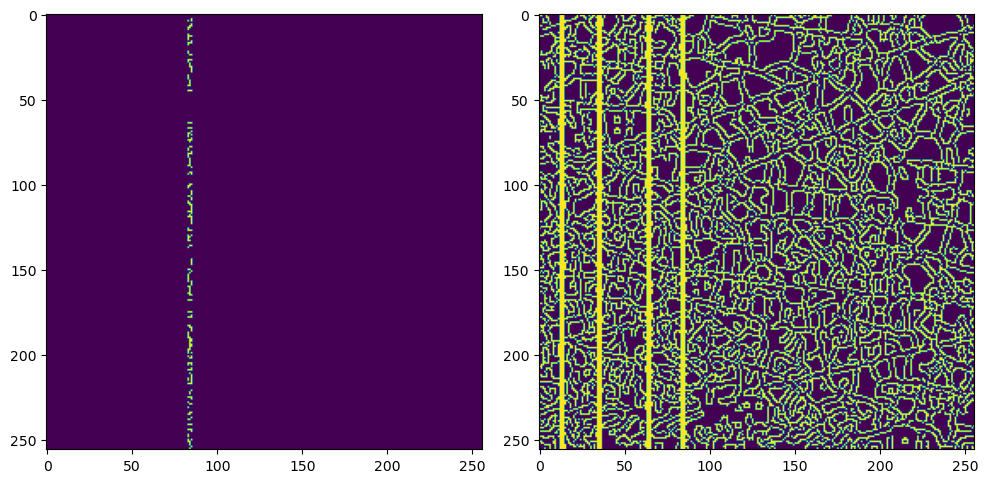

borehole 4: Line_pos = 84, Intersection count = 250, Fracture density = 0.3255208333333333


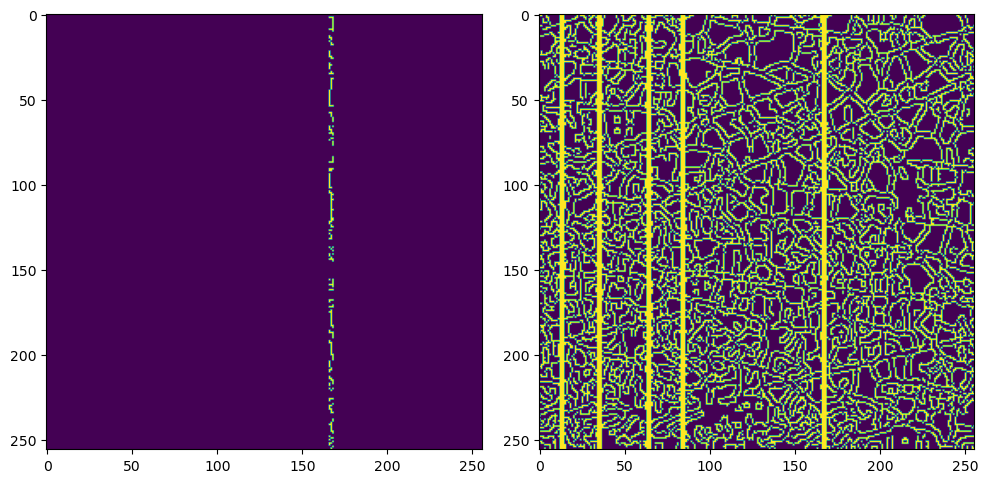

borehole 5: Line_pos = 167, Intersection count = 257, Fracture density = 0.3346354166666667


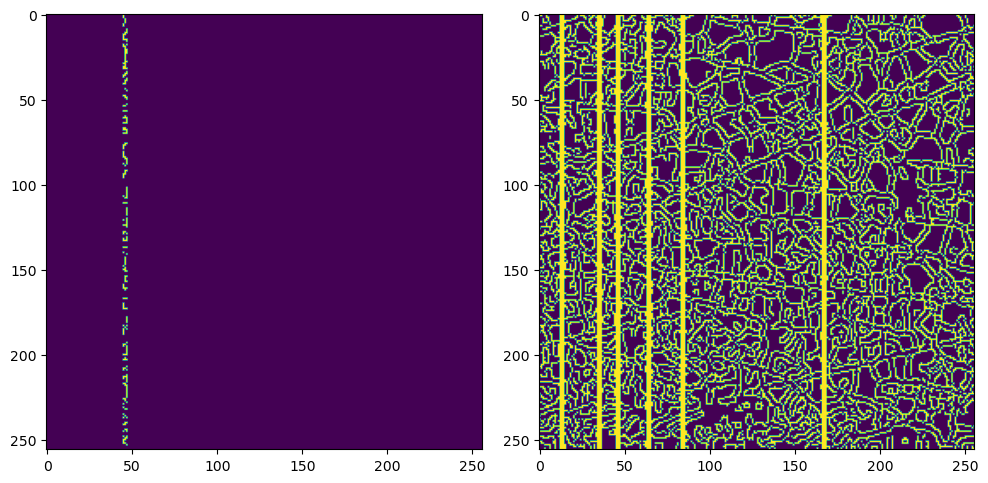

borehole 6: Line_pos = 46, Intersection count = 268, Fracture density = 0.3489583333333333


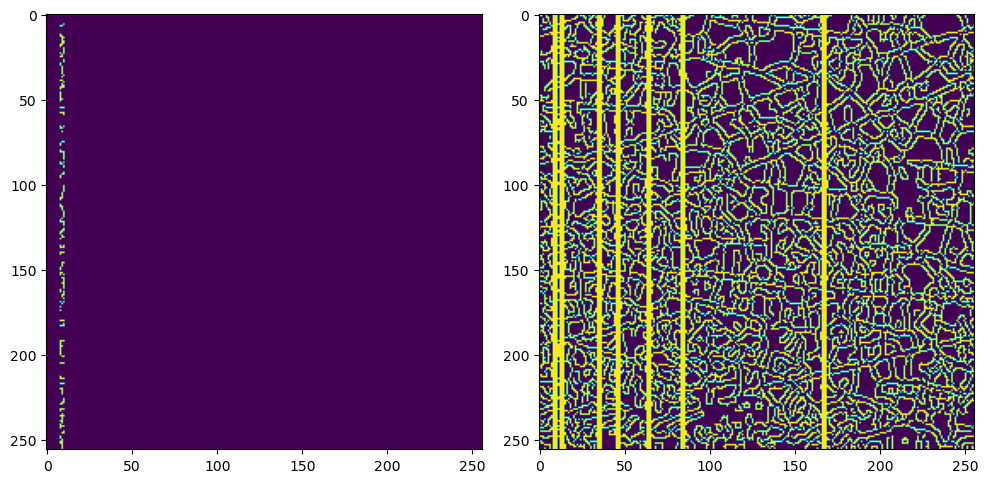

borehole 7: Line_pos = 9, Intersection count = 237, Fracture density = 0.30859375


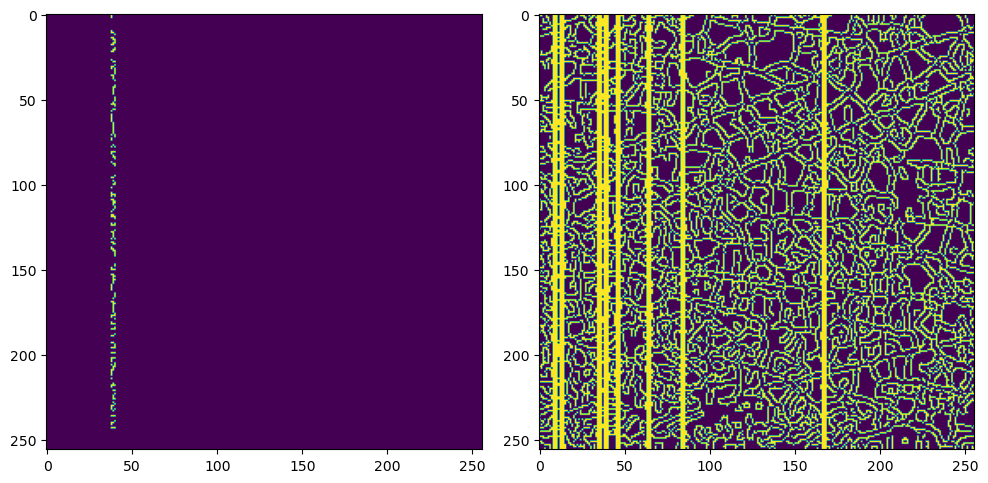

borehole 8: Line_pos = 39, Intersection count = 249, Fracture density = 0.32421875


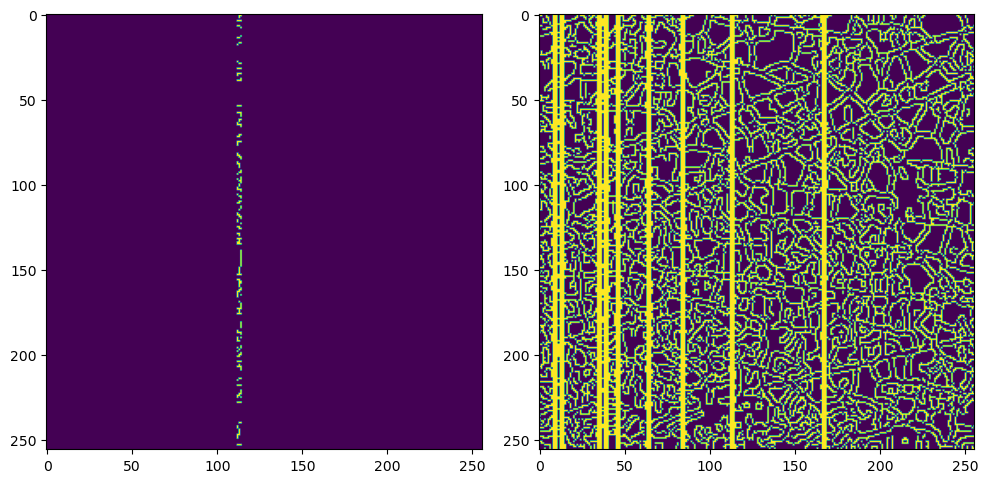

borehole 9: Line_pos = 113, Intersection count = 229, Fracture density = 0.2981770833333333


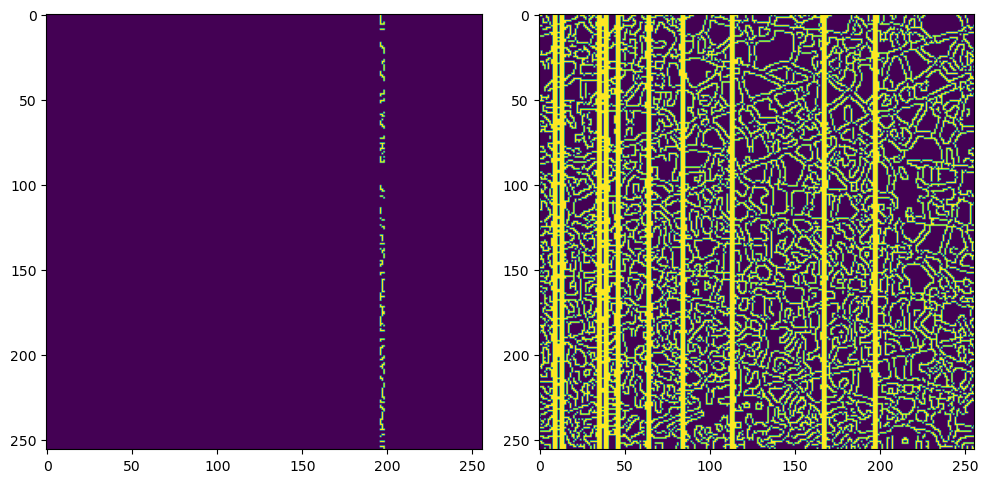

borehole 10: Line_pos = 197, Intersection count = 247, Fracture density = 0.3216145833333333


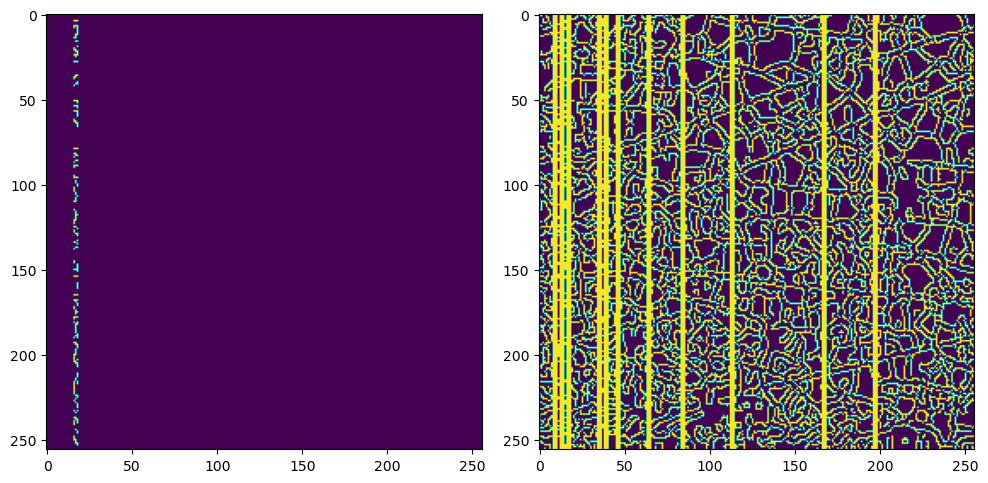

borehole 11: Line_pos = 17, Intersection count = 238, Fracture density = 0.3098958333333333


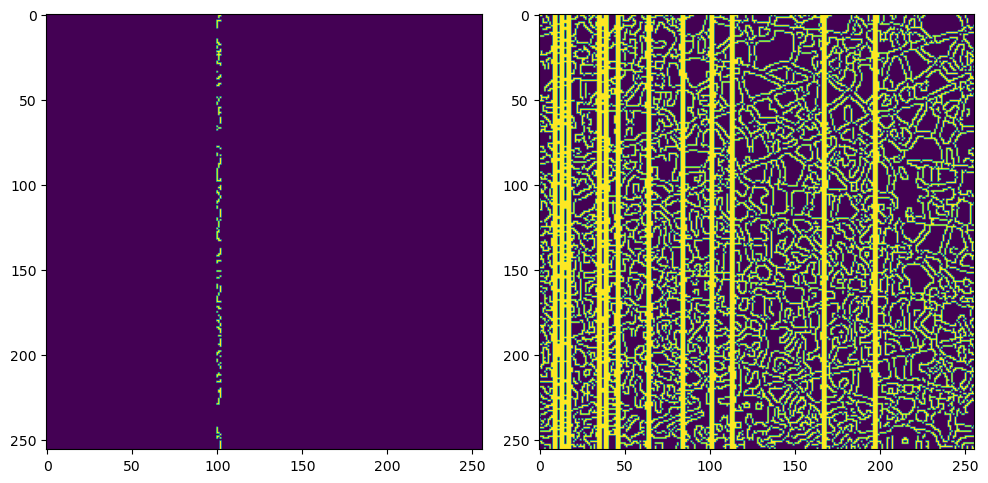

borehole 12: Line_pos = 101, Intersection count = 237, Fracture density = 0.30859375


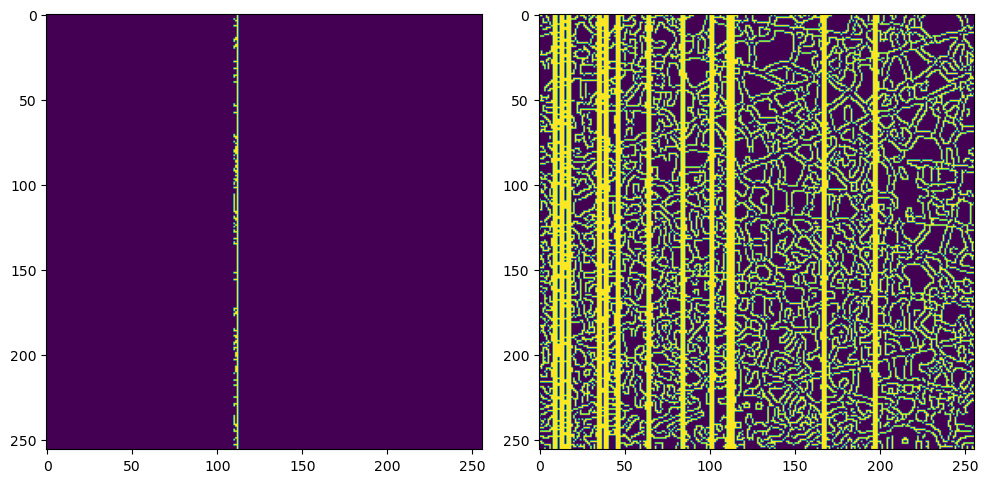

borehole 13: Line_pos = 111, Intersection count = 399, Fracture density = 0.51953125


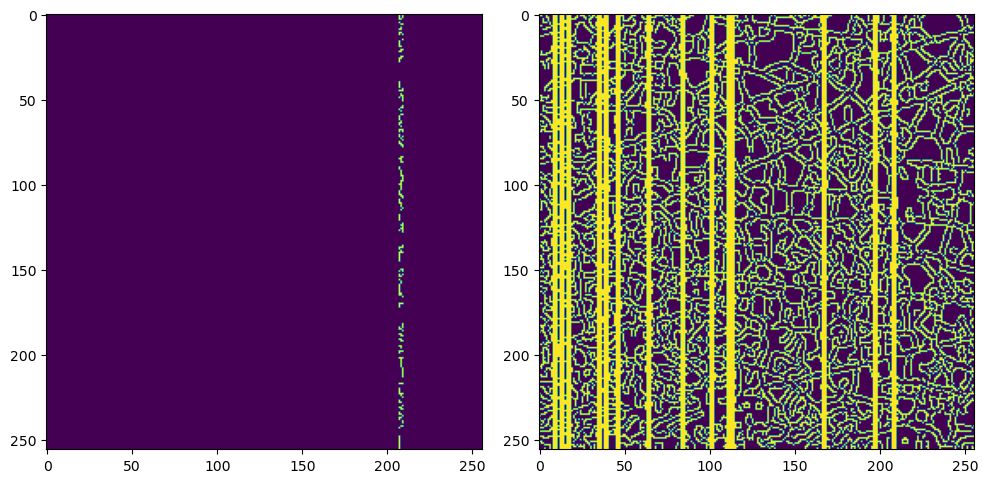

borehole 14: Line_pos = 208, Intersection count = 245, Fracture density = 0.3190104166666667


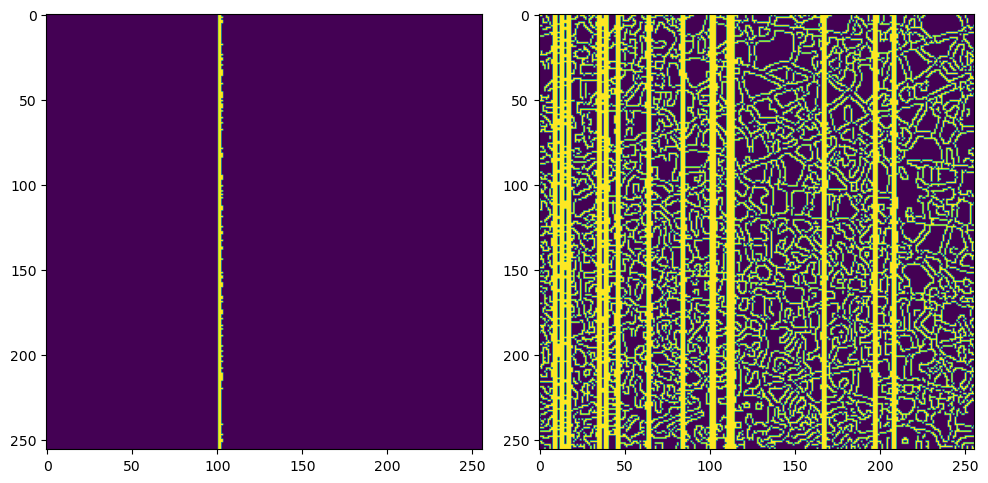

borehole 15: Line_pos = 102, Intersection count = 590, Fracture density = 0.7682291666666666


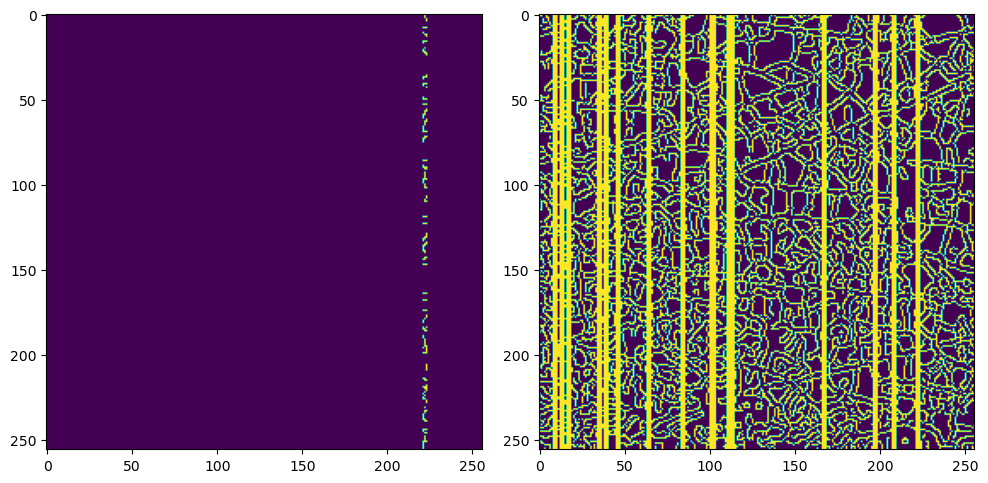

borehole 16: Line_pos = 222, Intersection count = 207, Fracture density = 0.26953125


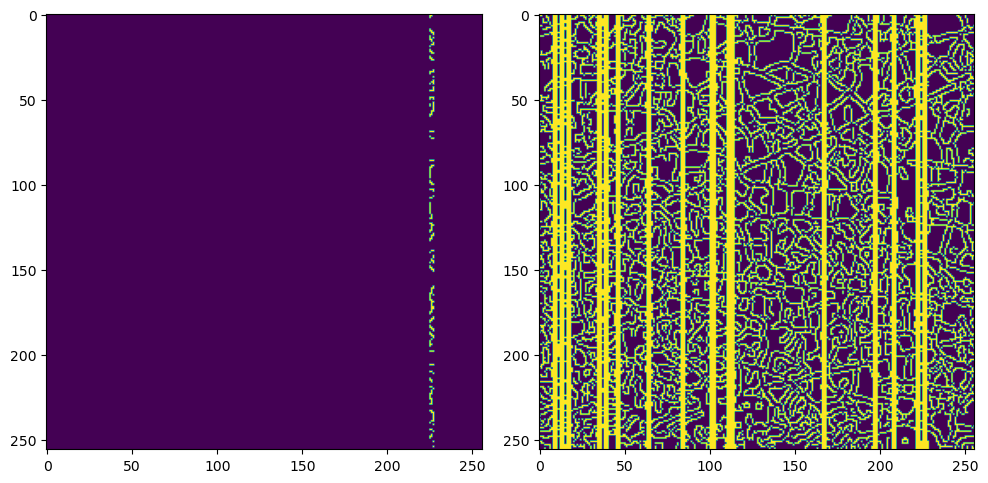

borehole 17: Line_pos = 226, Intersection count = 236, Fracture density = 0.3072916666666667


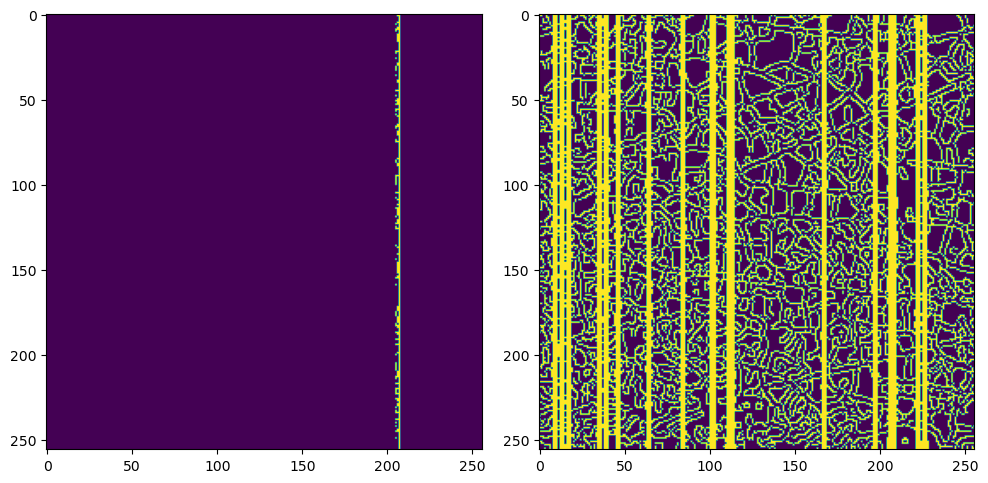

borehole 18: Line_pos = 206, Intersection count = 410, Fracture density = 0.5338541666666666


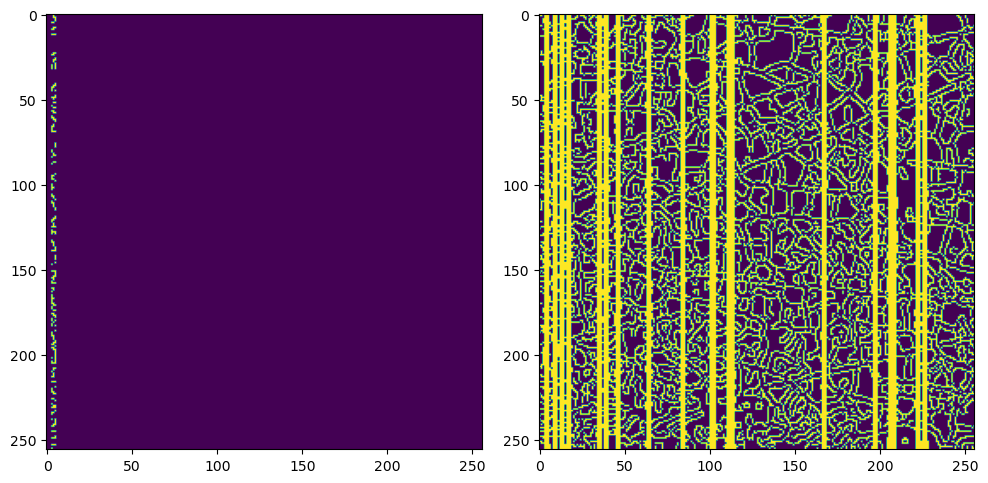

borehole 19: Line_pos = 4, Intersection count = 257, Fracture density = 0.3346354166666667


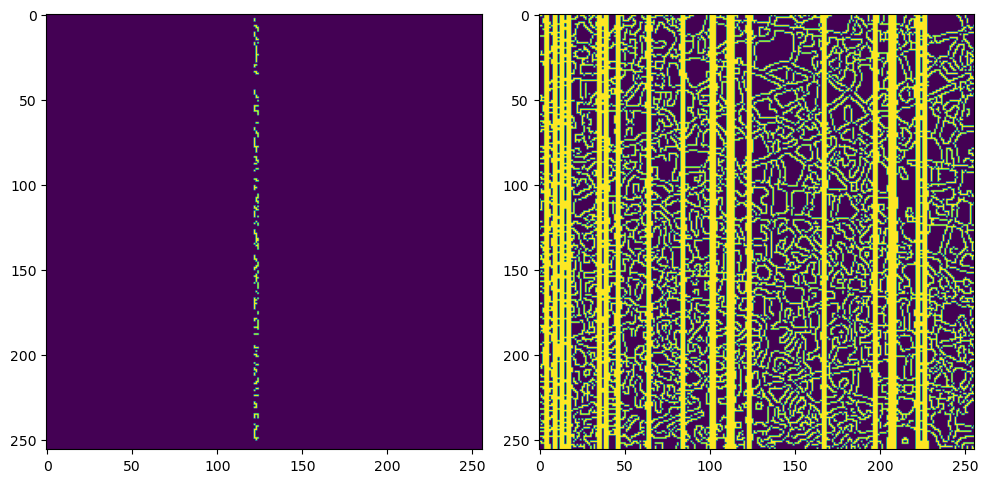

borehole 20: Line_pos = 123, Intersection count = 242, Fracture density = 0.3151041666666667


In [78]:
edges = edge_enhance('saved_predictions/sample_0_4_prediction.png')
height, width = edges.shape
num_boreholes = 20
fracture_density2= []
intersection_count2 = []
for i in range(num_boreholes):
    line_pos = int(np.random.uniform(width-1))
    f, ic = calculate_fracture_density2(edges, height, width, line_pos)
    fracture_density2.append(f)
    intersection_count2.append(ic)
    print(f"borehole {i+1}: Line_pos = {line_pos}, Intersection count = {intersection_count2[i]}, Fracture density = {fracture_density2[i]}")


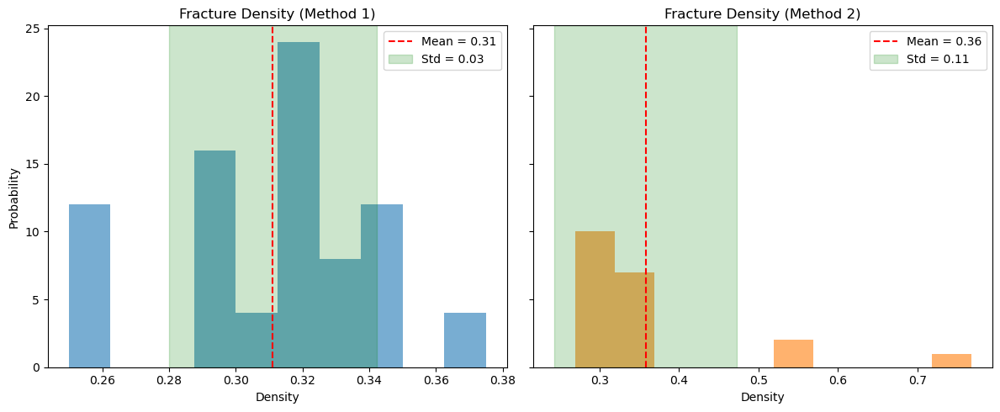

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# Suppose these are your collected density lists:
# fracture_density  = [ … ]  # method 1 results
# fracture_density2 = [ … ]  # method 2 results

# Compute stats
mean1, std1 = np.mean(fracture_density), np.std(fracture_density)
mean2, std2 = np.mean(fracture_density2), np.std(fracture_density2)

# Create side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Method 1
axes[0].hist(fracture_density, bins=10, density=True, alpha=0.6, color='C0')
axes[0].axvline(mean1, color='r', linestyle='--', label=f'Mean = {mean1:.2f}')
axes[0].axvspan(mean1-std1, mean1+std1, alpha=0.2, color='g', label=f'Std = {std1:.2f}')
axes[0].set_title('Fracture Density (Method 1)')
axes[0].set_xlabel('Density')
axes[0].set_ylabel('Probability')
axes[0].legend()

# Method 2
axes[1].hist(fracture_density2, bins=10, density=True, alpha=0.6, color='C1')
axes[1].axvline(mean2, color='r', linestyle='--', label=f'Mean = {mean2:.2f}')
axes[1].axvspan(mean2-std2, mean2+std2, alpha=0.2, color='g', label=f'Std = {std2:.2f}')
axes[1].set_title('Fracture Density (Method 2)')
axes[1].set_xlabel('Density')
axes[1].legend()

plt.tight_layout()
plt.show()


**Attention U-Net**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Attention Gate
class AttentionBlock(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(F_int)
        )
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        return x * psi

# Define Attention U-Net by inserting AttentionBlock between encoder and decoder skips
class AttUNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1, features=[64,128,256,512]):
        super().__init__()
        # reuse your DoubleConv from before
        self.downs = nn.ModuleList()
        self.pools = nn.ModuleList()
        for f in features:
            self.downs.append(DoubleConv(in_channels, f))
            self.pools.append(nn.MaxPool2d(2))
            in_channels = f
        self.bottleneck = DoubleConv(features[-1], features[-1]*2)
        # decoder
        self.ups = nn.ModuleList()
        self.attentions = nn.ModuleList()
        rev = features[::-1]
        for f in rev:
            self.ups.append(nn.ConvTranspose2d(f*2, f, kernel_size=2, stride=2))
            self.attentions.append(AttentionBlock(F_g=f, F_l=f, F_int=f//2))
            self.ups.append(DoubleConv(f*2, f))
        self.final = nn.Conv2d(features[0], out_channels, 1)

    def forward(self, x):
        skip_connections = []
        for down, pool in zip(self.downs, self.pools):
            x = down(x); skip_connections.append(x); x = pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        idx = 0
        for i in range(0, len(self.ups), 2):
            x = self.ups[i](x)
            sc = skip_connections[idx]; idx += 1
            sc = self.attentions[(i//2)](g=x, x=sc)
            x = torch.cat([sc, x], dim=1)
            x = self.ups[i+1](x)
        return self.final(x)

# Instantiate for your next experiment
model_att = AttUNet(in_channels=3, out_channels=1).to(device)
print(model_att)


AttUNet(
  (downs): ModuleList(
    (0): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (1): DoubleConv(
      (conv): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (5): ReLU(inplace=True)
      )
    )
    (2): DoubleConv(
     

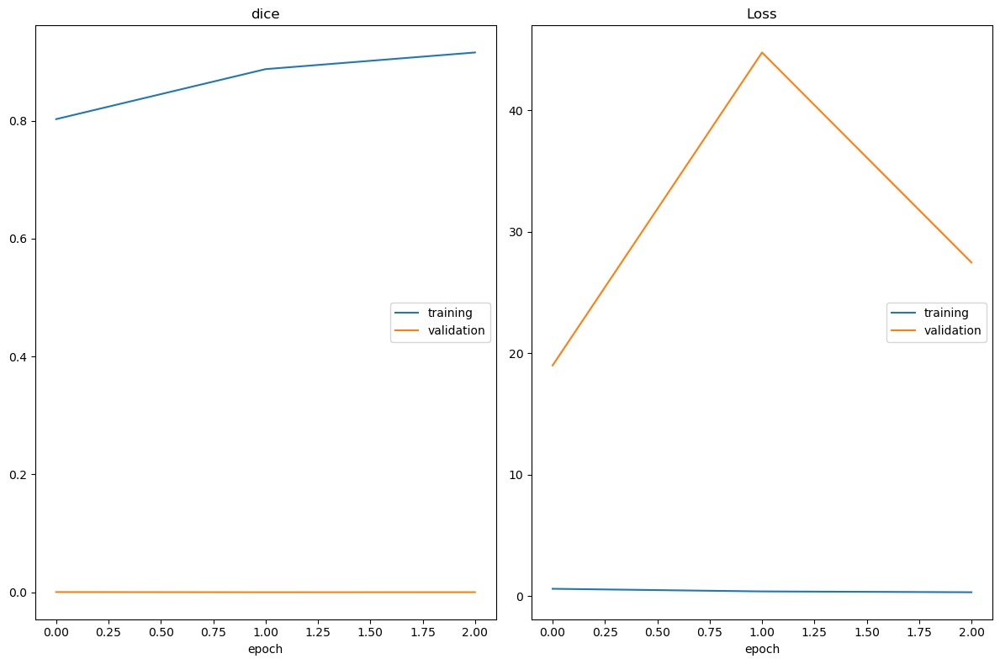

dice
	training         	 (min:    0.803, max:    0.916, cur:    0.916)
	validation       	 (min:    0.000, max:    0.000, cur:    0.000)
Loss
	training         	 (min:    0.307, max:    0.591, cur:    0.307)
	validation       	 (min:   18.988, max:   44.758, cur:   27.458)
27.458146572113037
Training Complete!


In [ ]:
model_att = AttUNet(in_channels=3, out_channels=1).to(device)
opt   = optim.Adam(model_att.parameters(), lr=1e-3)

criterion   = combined_dice_bce_loss
n_epochs    = 3


liveloss = PlotLosses()

for epoch in range(n_epochs):
    logs = {}
    train_loss, train_dice = train(model_att, opt, criterion, train_loader, device)
    logs['loss'] = train_loss
    logs['dice'] = train_dice

    val_loss, val_dice = validate(model_att, criterion, val_loader, device)
    logs['val_loss'] = val_loss
    logs['val_dice'] = val_dice

    liveloss.update(logs)
    liveloss.draw()
    print(val_loss)

print("Training Complete!")